In [1]:
import os #print(os.getcwd())
import random
import mplcursors
%matplotlib inline
import numpy as np
import pandas as pd
import plotly.io as pio
import plotly.express as px
from prophet import Prophet
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from scipy.spatial import cKDTree
import plotly.graph_objects as go

In [3]:
df_ca = pd.read_excel('Data.xlsx', sheet_name='Capacity Additions')
renewables = ['Utility-Scale Solar CA (GW-AC)', 'Distributed Solar CA (GW-AC)', 'Wind CA (GW-AC)', 'Storage CA (GW-AC)', 'Other RE CA (GW-AC)']
non_renewables = ['Gas CA (GW-AC)', 'Coal CA (GW-AC)', 'Other non-RE CA (GW-AC)']

df_ca['Renewable CA (GW-AC)'] = (df_ca[renewables]).sum(axis=1)
df_ca['Non-renewable CA (GW-AC)'] = (df_ca[non_renewables]).sum(axis=1)
print(df_ca)

    Year  Utility-Scale Solar CA (GW-AC)  Distributed Solar CA (GW-AC)  \
0   1998                          0.0000                      0.000000   
1   1999                          0.0000                      0.000000   
2   2000                          0.0000                      0.000000   
3   2001                          0.0000                      0.000000   
4   2002                          0.0000                      0.000000   
5   2003                          0.0000                      0.000000   
6   2004                          0.0000                      0.056587   
7   2005                          0.0000                      0.077616   
8   2006                          0.0000                      0.102587   
9   2007                          0.0829                      0.158541   
10  2008                          0.0100                      0.292961   
11  2009                          0.0550                      0.366761   
12  2010                          0.14

In [4]:
# list of values of 'Marks' column
marks_list = df_ca['Renewable CA (GW-AC)'].tolist()
 
# show the list
print(marks_list)

[0.4, 1.3, 0.270955, 2.292, 1.137, 2.005, 0.6925872040463245, 2.5996160399213335, 3.0085865465247537, 6.1344410799092515, 9.212960784313724, 11.15876094049107, 6.548745775074592, 9.3708, 17.80752, 8.747149999999998, 11.136347999999998, 16.153218000000003, 19.244484999999997, 16.438403, 16.735298999999998, 19.581378999999988, 33.351515000000006, 36.700058999999996, 32.411708999999995]


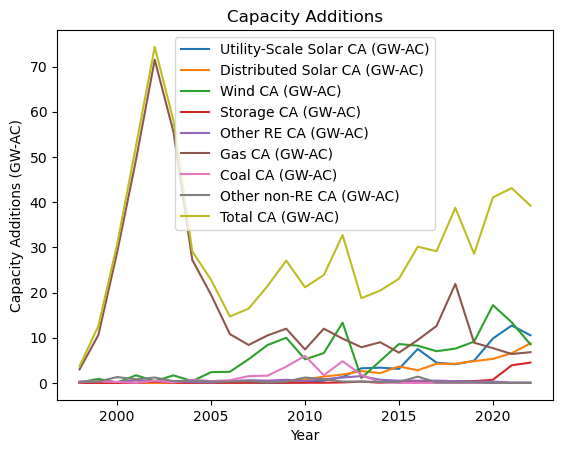

In [5]:
sources = ['Utility-Scale Solar CA (GW-AC)', 'Distributed Solar CA (GW-AC)', 'Wind CA (GW-AC)', 'Storage CA (GW-AC)', 'Other RE CA (GW-AC)', 'Gas CA (GW-AC)', 'Coal CA (GW-AC)', 'Other non-RE CA (GW-AC)', 'Total CA (GW-AC)']

fig, ax = plt.subplots()
for source in sources: 
    line, = ax.plot(df_ca['Year'], df_ca[source], label=source)
    mplcursors.cursor([line], hover=True).connect("add", lambda sel: sel.annotation.set_text(source))
    
ax.set_xlabel('Year')
ax.set_ylabel('Capacity Additions (GW-AC)')
ax.set_title('Capacity Additions')
plt.legend()
#plt.show()

In [8]:
def get_random_ren_additions(years: int, mean: int, std_dev: int):
    return np.random.normal(loc=mean, scale=std_dev, size=years)
ren_additions = get_random_ren_additions(years=13, mean=70000, std_dev=1000)
print(ren_additions)

[69652.77219288 70940.93614408 70413.59729043 68346.02712089
 69804.11566308 71406.41850833 67741.44934832 70960.31250252
 68647.15085863 69421.69406048 68295.88022018 72111.94416735
 69210.10917873]


In [ ]:
def get_random_ren_additions(years: int, mean: int, std_dev=20000, max_value=70000):
    additions = np.random.normal(loc=mean, scale=std_dev, size=years)
    while np.any(additions > max_value):
        additions[additions > max_value] = np.random.normal(loc=mean, scale=std_dev, size=np.sum(additions > max_value))
    return additions

In [117]:
def get_random_ren_additions(years: int, mean: int, std_dev=20000, min_value=0, max_value=70000):
    additions = np.random.normal(loc=mean, scale=std_dev, size=years)
    if max_value is not None:
        while np.any(additions > max_value) or np.any(additions < min_value):
            additions = np.where((additions > max_value) | (additions < min_value), 
                                 np.random.normal(loc=mean, scale=std_dev, size=years), 
                                 additions)
    return additions

ren_additions = get_random_ren_additions(years=13, mean=65000)
print(ren_additions)

[53362.5113022  46238.87628205 69821.61890553 58625.19391775
 44167.5777414  41025.34609821 68682.02151536 48697.90117783
 51354.8801689  63796.70991024 58386.16258312 36047.14628806
 59689.67779377]


In [143]:
def get_random_ren_additions(years: int, start=10000, end=70000):
    return np.random.randint(start, end+1, years).tolist()
    
def get_random_non_ren_additions(years: int, start=2000, end=10000):    
    return np.random.randint(start, end+1, years).tolist()
    
def get_random_ren_retirements(years: int, start=0, end=100):
    return np.random.randint(start, end+1, years).tolist()

def get_random_non_ren_retirements(years: int, start=5000, end=20000):    
    return np.random.randint(start, end+1, years).tolist()

def get_confidence_levels(final_capacities):    
    upper_confidence = round(np.quantile(final_capacities, 0.975), 2)
    lower_confidence = round(np.quantile(final_capacities, 0.025), 2)
    
    return lower_confidence, upper_confidence

def get_yearly_percentiles(results, inputs) -> pd.DataFrame:
    """
    Finds the percentiles for each year.
    """
    results_rotated = list(zip(*results[::-1]))

    count = []
    year = []
    ninetieth_percentile = []
    seventy_fifth_percentile = []
    median = []
    twenty_fifth_percentile = []
    tenth_percentile = []
    
    for i, year_results in enumerate(results_rotated):
        new_year = (inputs['start_age'] + 1) + i
        ninetieth_percentile_value = np.percentile(year_results, 90)
        seventy_fifth_percentile_value = np.percentile(year_results, 75)
        median_value = np.median(year_results)
        twenty_fifth_percentile_value = np.percentile(year_results, 25)
        tenth_percentile_value = np.percentile(year_results, 10)
        
        count.append(i + 1)
        year.append(new_year)
        ninetieth_percentile.append(ninetieth_percentile_value)
        seventy_fifth_percentile.append(seventy_fifth_percentile_value)
        median.append(median_value)
        twenty_fifth_percentile.append(twenty_fifth_percentile_value)
        tenth_percentile.append(tenth_percentile_value)
        

    return pd.DataFrame(
        list(
            zip(count,
                year,
                ninetieth_percentile, 
                seventy_fifth_percentile,
                median, 
                twenty_fifth_percentile,
                tenth_percentile)
        ),
        columns=[
            'count',
            'year',
            '90th_percentile',
            '75th_percentile',
            'median', 
            '25th_percentile',
            '10th_percentile']
    )

In [144]:
def plot_simulations(cumulatives, title, xaxis_title, yaxis_title, inputs):
    years = list(range(inputs['start_age'], inputs['end_age']))

    # Plot the simulations
    fig = go.Figure()

    for simulation in cumulatives:
        fig.add_trace(go.Scatter(x=years, y=simulation, mode='lines', line=dict(width=0.5), opacity=0.3, name='Capacity'))

    fig.update_layout(
        title=title,
        xaxis_title=xaxis_title,
        yaxis_title=yaxis_title,
        showlegend=False
    )

    return fig

In [145]:
def plot_yearly_percentiles(renewable_df, non_renewable_df, inputs):
    # Extract the target capacities from the inputs
    target_ren_capacity = inputs['target_ren_capacity']
    target_non_ren_capacity = inputs['target_non_ren_capacity']
    
    # Extract the years for plotting
    years = renewable_df['year']
    
    # Plot renewable data
    plt.figure(figsize=(14, 7))
    
    plt.plot(years, renewable_df['90th_percentile'], label='90th Percentile (Renewable)', color='blue')
    plt.plot(years, renewable_df['75th_percentile'], label='75th Percentile (Renewable)', color='green')
    plt.plot(years, renewable_df['median'], label='Median (Renewable)', color='red')
    plt.plot(years, renewable_df['25th_percentile'], label='25th Percentile (Renewable)', color='orange')
    plt.plot(years, renewable_df['10th_percentile'], label='10th Percentile (Renewable)', color='purple')
    
    # Plot non-renewable data
    plt.plot(years, non_renewable_df['90th_percentile'], label='90th Percentile (Non-Renewable)', color='blue', linestyle='--')
    plt.plot(years, non_renewable_df['75th_percentile'], label='75th Percentile (Non-Renewable)', color='green', linestyle='--')
    plt.plot(years, non_renewable_df['median'], label='Median (Non-Renewable)', color='red', linestyle='--')
    plt.plot(years, non_renewable_df['25th_percentile'], label='25th Percentile (Non-Renewable)', color='orange', linestyle='--')
    plt.plot(years, non_renewable_df['10th_percentile'], label='10th Percentile (Non-Renewable)', color='purple', linestyle='--')
    
    # Plot target lines
    plt.axhline(y=target_ren_capacity, color='red', linestyle=':', linewidth=1, label=f'Target Renewable Capacity ({target_ren_capacity})')
    plt.axhline(y=target_non_ren_capacity, color='red', linestyle=':', linewidth=1, label=f'Target Non-Renewable Capacity ({target_non_ren_capacity})')

    # Add text annotations for target lines next to the y-axis
    plt.text(years.min(), target_ren_capacity, f'Target Renewable Capacity ({target_ren_capacity})', color='red', verticalalignment='bottom', horizontalalignment='left', fontsize=10)
    plt.text(years.min(), target_non_ren_capacity, f'Target Non-Renewable Capacity ({target_non_ren_capacity})', color='red', verticalalignment='bottom', horizontalalignment='left', fontsize=10)

    # Calculate the years where the percentiles reach the targets and plot vertical lines
    for percentile in ['90th_percentile', '75th_percentile', 'median', '25th_percentile', '10th_percentile']:
        ren_reach_year = years[renewable_df[percentile] >= target_ren_capacity].min()
        non_ren_reach_year = years[non_renewable_df[percentile] <= target_non_ren_capacity].min()
        
        if pd.notna(ren_reach_year):
            plt.axvline(x=ren_reach_year, color='red', linestyle='--', linewidth=0.8)

        if pd.notna(non_ren_reach_year):
            plt.axvline(x=non_ren_reach_year, color='black', linestyle='--', linewidth=0.8)
    
    plt.xlabel('Year')
    plt.ylabel('Capacity (MW)')
    plt.title('Yearly Percentiles of Renewable and Non-Renewable Capacities')
    plt.grid(True)
    
    # Move legend outside of the plot
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    
    plt.show()

In [146]:
def plot_yearly_percentiles(df, target_capacity, title, renewable=True):
    # Extract the years for plotting
    years = df['year']
    
    # Create the plotly figure
    fig = go.Figure()

    # Plot data with hover information
    for col, color, name in zip(['90th_percentile', '75th_percentile', 'median', '25th_percentile', '10th_percentile'],
                                ['blue', 'green', 'red', 'orange', 'purple'],
                                ['90th %tile', '75th %tile', 'Median', '25th %tile', '10th %tile']):
        fig.add_trace(go.Scatter(
            x=years, y=df[col], mode='lines', name=name,
            line=dict(color=color), hoverinfo='x+text', text=[f'{val} ({name})' for val in df[col]]
        ))

    # Plot target line
    fig.add_trace(go.Scatter(
        x=[years.min(), years.max()], y=[target_capacity, target_capacity], mode='lines', name=f'Target Capacity ({target_capacity})',
        line=dict(color='red', dash='dot'), hoverinfo='skip'
    ))

    # Calculate the years where the percentiles reach the targets and plot vertical lines
    for percentile, color in zip(['90th_percentile', '75th_percentile', 'median', '25th_percentile', '10th_percentile'], ['blue', 'green', 'red', 'orange', 'purple']):
        if renewable:
            reach_year = years[df[percentile] >= target_capacity].min()
        else:
            reach_year = years[df[percentile] <= target_capacity].min()
        
        if pd.notna(reach_year):
            fig.add_trace(go.Scatter(
                x=[reach_year, reach_year], y=[0, df[percentile].max()], mode='lines', line=dict(color=color, dash='dash' if renewable else 'dot'), showlegend=False, hoverinfo='skip'
            ))

    # Update layout
    fig.update_layout(
        title=title,
        xaxis_title='Year',
        yaxis_title='Capacity (MW)',
        #legend=dict(x=1.05, y=0.5, bordercolor="Black", borderwidth=1),
        showlegend=False,
        template='plotly_white'
    )

    # Customize hover mode to compare data across all traces
    fig.update_layout(hovermode='x unified')

    # Show the figure
    return fig

In [147]:
def perform_simulation(inputs: dict):
    renewable_addition = inputs['renewable_addition']
    renewable = inputs['renewable']
    non_renewable = inputs['non_renewable']
    
    years = inputs['end_age'] - inputs['start_age']
        
    ren_additions = get_random_ren_additions(years=years)
    non_ren_additions = get_random_non_ren_additions(years=years)
    
    ren_retirements = get_random_ren_retirements(years=years)
    non_ren_retirements = get_random_non_ren_retirements(years=years, start=10000, end=renewable_addition)
    
    ren_cumulative = []
    non_ren_cumulative = []
    
    for i in range(years):    
        renewable += ren_additions[i]
        non_renewable += non_ren_additions[i]
        
        renewable -= ren_retirements[i]
        non_renewable -= non_ren_retirements[i]
        
        ren_cumulative.append(int(renewable))
        non_ren_cumulative.append(int(non_renewable))
        
    return renewable, non_renewable, ren_cumulative, non_ren_cumulative

def perform_monte_carlo(inputs: dict, n: int = 1000):
    renewable = []
    non_renewable = []
    ren_cumulatives = []
    non_ren_cumulatives = []
    
    for i in range(n):
        final_ren, final_non_ren, ren_cumulative, non_ren_cumulative = perform_simulation(inputs)
        renewable.append(final_ren)
        non_renewable.append(final_non_ren)
        ren_cumulatives.append(ren_cumulative)
        non_ren_cumulatives.append(non_ren_cumulative)
        
    renewable_lower_confidence, renewable_upper_confidence = get_confidence_levels(renewable)
    non_renewable_lower_confidence, non_renewable_upper_confidence = get_confidence_levels(non_renewable)
            
    return {
        'renewable': renewable,
        'non_renewable': non_renewable,
        'ren_cumulatives': ren_cumulatives,
        'non_ren_cumulatives': non_ren_cumulatives,
        'renewable_lower_confidence': renewable_lower_confidence,
        'renewable_upper_confidence': renewable_upper_confidence, 
        'non_renewable_lower_confidence': non_renewable_lower_confidence,
        'non_renewable_upper_confidence': non_renewable_upper_confidence, 
        'ren_yearly_percentiles': get_yearly_percentiles(ren_cumulatives, inputs),
        'non_ren_yearly_percentiles': get_yearly_percentiles(non_ren_cumulatives, inputs)
    }

inputs = {
        'renewable_addition': 65000,
        'start_age': 2022,
        'end_age': 2035,
        'renewable': 213456,
        'non_renewable': 754321,
        'target_ren_capacity': 910000,
        'target_non_ren_capacity': 200000,
        'n_simulations': 10000       
        }
mc = perform_monte_carlo(inputs, n=inputs['n_simulations'])

In [148]:
print(mc['ren_yearly_percentiles'])

    count  year  90th_percentile  75th_percentile    median  25th_percentile  \
0       1  2023         277455.0        268112.75  253276.0        238563.25   
1       2  2024         326256.5        311034.75  293252.5        275668.25   
2       3  2025         372984.0        354366.25  333025.5        311914.00   
3       4  2026         418880.1        396993.50  372945.5        348973.25   
4       5  2027         463681.9        439693.25  413108.0        386370.50   
5       6  2028         507876.6        482319.25  453332.5        423485.25   
6       7  2029         551835.4        524517.25  492617.0        460964.50   
7       8  2030         596565.7        567479.25  533011.5        498819.50   
8       9  2031         640158.8        609555.50  572833.0        535972.50   
9      10  2032         684300.3        651829.00  612968.5        575041.75   
10     11  2033         728741.4        693417.75  654044.5        613720.25   
11     12  2034         772062.7        

In [149]:
print(mc['non_ren_yearly_percentiles'])

    count  year  90th_percentile  75th_percentile    median  25th_percentile  \
0       1  2023         744898.1        736797.50  722865.0        709281.75   
1       2  2024         722192.3        707654.75  691761.0        675261.75   
2       3  2025         695571.2        680149.00  660219.0        640258.00   
3       4  2026         670677.9        651643.25  628480.0        605616.00   
4       5  2027         643435.2        622132.75  596931.5        571827.75   
5       6  2028         616388.8        592816.50  565298.5        537366.75   
6       7  2029         589063.3        563516.25  533849.5        503630.75   
7       8  2030         561694.7        533971.75  501946.5        471246.25   
8       9  2031         532768.7        504405.00  470876.0        437168.50   
9      10  2032         505239.9        474385.50  439141.0        404397.50   
10     11  2033         475935.2        444917.75  407250.0        370715.75   
11     12  2034         447582.6        

In [150]:
plot_yearly_percentiles(mc['ren_yearly_percentiles'], inputs['target_ren_capacity'], 'Renewable Capacity Percentiles', renewable=True)

In [151]:
plot_yearly_percentiles(mc['non_ren_yearly_percentiles'], inputs['target_non_ren_capacity'], 'Non-renewable Capacity Percentiles', renewable=False)

In [152]:
plot_simulations(mc['ren_cumulatives'], "Renewable Capacity Simulations", "Year", "Capacity (MW)", inputs)

In [51]:
plot_simulations(mc['non_ren_cumulatives'], "Non-Renewable Capacity Simulations", "Year", "Capacity (MW)", inputs)